# **📄 Document type classification EDA**

## Contents
- Prepare Environments
- Import Library & Define Dataset
- Load Data
- EDA


## 1. Prepare Environments

* 데이터 로드를 위한 구글 드라이브를 마운트합니다.
* 필요한 라이브러리를 설치합니다.

In [1]:
# 필요한 라이브러리를 설치합니다.
# !pip install timm
# !pip install wandb
# !pip install matplotlib
# !pip install seaborn

## 2. Import Library

In [2]:
import os
import time
import random

import timm
import torch
import albumentations as A
import pandas as pd
import numpy as np
import torch.nn as nn
from albumentations.pytorch import ToTensorV2
from torch.optim import Adam
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score

import wandb
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# 데이터셋 클래스를 정의합니다.
class ImageDataset(Dataset):
    def __init__(self, csv, path, transform=None):
        self.df = pd.read_csv(csv).values
        self.path = path
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        name, target = self.df[idx]
        img = np.array(Image.open(os.path.join(self.path, name)))
        if self.transform:
            img = self.transform(image=img)['image']
        return img, target
    
# meta.csv 파일 읽기
meta_data = pd.read_csv('data/meta.csv')
label_to_class_name = dict(zip(meta_data['target'], meta_data['class_name']))

## 3. Load Data
* 학습, 테스트 데이터셋과 로더를 정의합니다.

In [4]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# data config
data_path = 'data/'

# model config
model_name = 'resnet34' # 'resnet50' 'efficientnet-b0', ...

# training config
img_size = 224
LR = 1e-3
EPOCHS = 1
BATCH_SIZE = 32
num_workers = 0

In [5]:
# augmentation을 위한 transform 코드
trn_transform = A.Compose([
    # 이미지 크기 조정
    # A.Resize(height=img_size, width=img_size),
    # images normalization
    # A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    # numpy 이미지나 PIL 이미지를 PyTorch 텐서로 변환
    ToTensorV2(),
])

# test image 변환을 위한 transform 코드
tst_transform = A.Compose([
    # A.Resize(height=img_size, width=img_size),
    # A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2(),
])

In [6]:
# Dataset 정의
trn_dataset = ImageDataset(
    "data/train.csv",
    "data/train/",
    transform=trn_transform
)
tst_dataset = ImageDataset(
    "data/sample_submission.csv",
    "data/test/",
    transform=tst_transform
)
print(len(trn_dataset), len(tst_dataset))

1570 3140


## 4. EDA

In [7]:
wandb.init(project = 'soyoung', name = 'eda')

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


wandb: Currently logged in as: sycj427 (aistages-cv-04). Use `wandb login --relogin` to force relogin


### 4.1. 데이터 이미지 크기 및 통계

#### 4.1.1. 훈련 데이터

In [8]:
data_dir = 'data/train'
image_files = os.listdir(data_dir)

# 랜덤하게 이미지 샘플링하여 크기 확인
num_samples = 20
random_sample_images = random.sample(image_files, num_samples)

for image_file in random_sample_images:
    image_path = os.path.join(data_dir, image_file)
    with Image.open(image_path) as img:
        width, height = img.size
        print(f"Image: {image_file}, Width: {width}, Height: {height}")

Image: a8e56e8a521266dd.jpg, Width: 591, Height: 443
Image: b7389314404b2d96.jpg, Width: 443, Height: 591
Image: 0ac9d741be9c6757.jpg, Width: 639, Height: 409
Image: 0482c84f6e50fc44.jpg, Width: 637, Height: 411
Image: fa3d55efc42982a7.jpg, Width: 591, Height: 443
Image: 8513926fb711c64f.jpg, Width: 443, Height: 591
Image: 3963920965897f10.jpg, Width: 443, Height: 591
Image: 0664699c12c8162c.jpg, Width: 591, Height: 443
Image: 638449335fbd1759.jpg, Width: 443, Height: 591
Image: cb21eaf0f58e325a.jpg, Width: 591, Height: 443
Image: de884241d9d56c7d.jpg, Width: 591, Height: 443
Image: f2079413e6c49f35.jpg, Width: 640, Height: 409
Image: edbce4c482ef0ca5.jpg, Width: 636, Height: 411
Image: 8896e2785aae4234.jpg, Width: 591, Height: 443
Image: 14415a54a4805c75.jpg, Width: 443, Height: 591
Image: 1258871e4d7347be.jpg, Width: 443, Height: 591
Image: 88c917b4708fb4d0.jpg, Width: 443, Height: 591
Image: 2a69eaae1b584459.jpg, Width: 591, Height: 443
Image: 628983df06fa9dc1.jpg, Width: 443, Heigh

In [9]:
# 이미지 크기 통계 계산
widths, heights = [], []
for image_file in image_files:
    image_path = os.path.join(data_dir, image_file)
    with Image.open(image_path) as img:
        width, height = img.size
        widths.append(width)
        heights.append(height)

# 평균과 표준 편차 출력
mean_width = sum(widths) / len(widths)
mean_height = sum(heights) / len(heights)
std_width = (sum((w - mean_width) ** 2 for w in widths) / len(widths)) ** 0.5
std_height = (sum((h - mean_height) ** 2 for h in heights) / len(heights)) ** 0.5

print(f"Mean Width: {mean_width}, Mean Height: {mean_height}")
print(f"Standard Deviation Width: {std_width}, Standard Deviation Height: {std_height}")

Mean Width: 497.61337579617833, Mean Height: 538.1694267515924
Standard Deviation Width: 79.34503511977368, Standard Deviation Height: 76.0505402372138


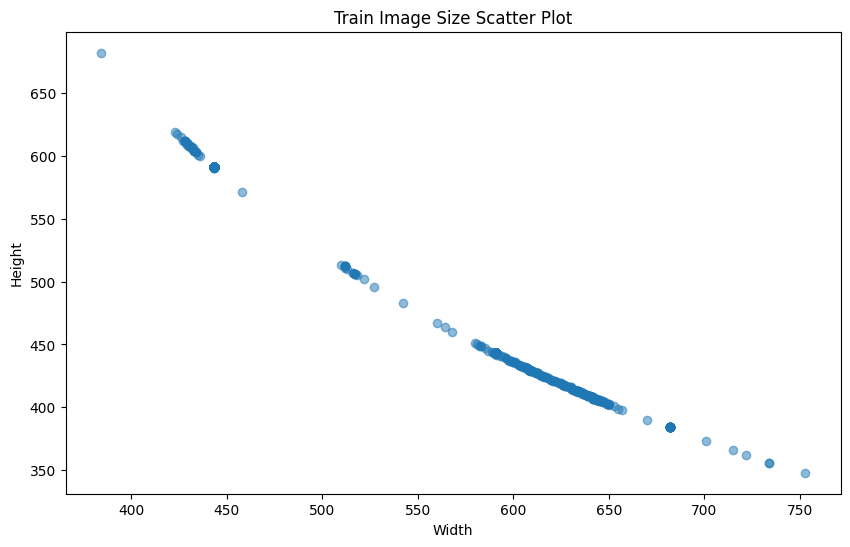

In [10]:
# 이미지 width, height 기준 산점도 그리기
plt.figure(figsize=(10, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.title('Train Image Size Scatter Plot')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

#### 4.1.2. 평가 데이터

In [11]:
data_dir = 'data/test'
image_files = os.listdir(data_dir)

# 랜덤하게 이미지 샘플링하여 크기 확인
num_samples = 20
random_sample_images = random.sample(image_files, num_samples)

for image_file in random_sample_images:
    image_path = os.path.join(data_dir, image_file)
    with Image.open(image_path) as img:
        width, height = img.size
        print(f"Image: {image_file}, Width: {width}, Height: {height}")

Image: 6af2e2f88ffb0827.jpg, Width: 443, Height: 591
Image: d8b849ce22e52fa3.jpg, Width: 616, Height: 425
Image: 5012a0f3974a8eef.jpg, Width: 512, Height: 512
Image: e4d3e4878eac53fa.jpg, Width: 591, Height: 443
Image: 4118d3ed4ad3e6ed.jpg, Width: 443, Height: 591
Image: 4f8f8fa12f2dc565.jpg, Width: 443, Height: 591
Image: 6958c82413f93f2a.jpg, Width: 591, Height: 443
Image: cf0e93f4924ae5c1.jpg, Width: 443, Height: 591
Image: dccbcea4a69ce6df.jpg, Width: 591, Height: 443
Image: 87ee323e013aec1c.jpg, Width: 443, Height: 591
Image: 9be22a8b31220be8.jpg, Width: 443, Height: 591
Image: 7a61055594f9f2c0.jpg, Width: 655, Height: 399
Image: f5e808667c1a793f.jpg, Width: 591, Height: 443
Image: ee95f03ddacbbb76.jpg, Width: 591, Height: 443
Image: e326dab2e46de44e.jpg, Width: 591, Height: 443
Image: 500a7f7082201785.jpg, Width: 591, Height: 443
Image: 8b8398aefc903ff9.jpg, Width: 443, Height: 591
Image: ffc2c91dff8cf2c0.jpg, Width: 639, Height: 409
Image: cc5b1cd2851ce46a.jpg, Width: 443, Heigh

In [12]:
# 이미지 크기 통계 계산
widths, heights = [], []
for image_file in image_files:
    image_path = os.path.join(data_dir, image_file)
    with Image.open(image_path) as img:
        width, height = img.size
        widths.append(width)
        heights.append(height)

# 평균과 표준 편차 출력
mean_width = sum(widths) / len(widths)
mean_height = sum(heights) / len(heights)
std_width = (sum((w - mean_width) ** 2 for w in widths) / len(widths)) ** 0.5
std_height = (sum((h - mean_height) ** 2 for h in heights) / len(heights)) ** 0.5

print(f"Mean Width: {mean_width}, Mean Height: {mean_height}")
print(f"Standard Deviation Width: {std_width}, Standard Deviation Height: {std_height}")

Mean Width: 517.0850318471338, Mean Height: 518.5563694267516
Standard Deviation Width: 79.83384077345998, Standard Deviation Height: 79.79125836618833


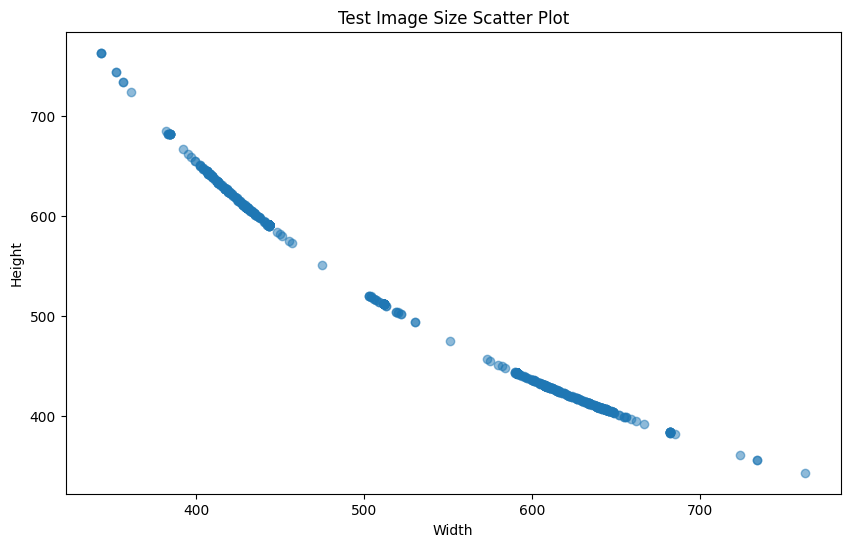

In [13]:
# 이미지 width, height 기준 산점도 그리기
plt.figure(figsize=(10, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.title('Test Image Size Scatter Plot')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

### 4.2 훈련 데이터 이미지 시각화 및 클래스 분포

index:  [1107, 574, 1356, 1432, 1443, 665, 677, 1541, 1411, 937, 399, 417, 1195, 621, 1343, 92, 1364, 313, 1345, 511]


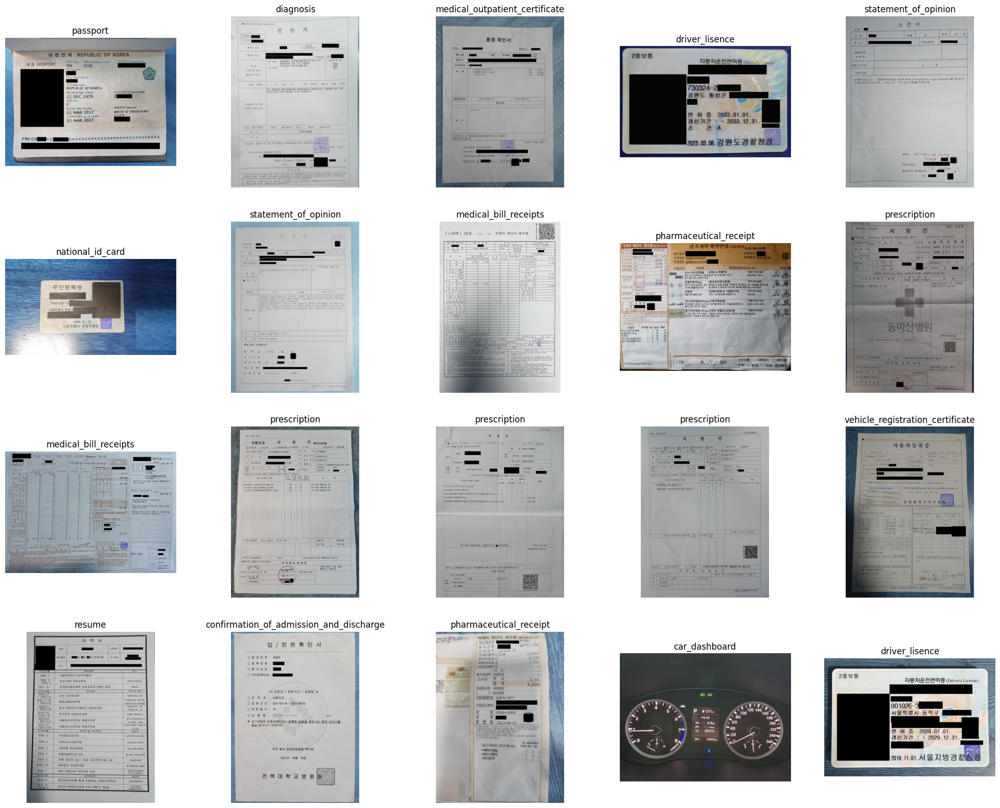

In [14]:
# 시각화할 이미지 개수
img_count = 20

# 데이터셋의 총 길이를 가져옴
dataset_len = len(trn_dataset)

# 무작위로 선택된 인덱스 리스트를 생성
selected_indices = random.sample(range(dataset_len), img_count)
print("index: ", selected_indices)

# WandB에 이미지 로깅
wandb.log({"train_images": [wandb.Image(image, caption=label_to_class_name[label]) for i in selected_indices for image, label in [trn_dataset[i]]]})

# 로컬에서 이미지 플로팅
fig, axes = plt.subplots(img_count // 5, 5, figsize=(25, 5 * (img_count // 5)))
for i, idx in enumerate(selected_indices):
    image, label = trn_dataset[idx]
    row_idx = i // 5  
    col_idx = i % 5 
    axes[row_idx, col_idx].imshow(image.permute(1, 2, 0))
    axes[row_idx, col_idx].set_title(label_to_class_name[label])
    axes[row_idx, col_idx].axis('off')

plt.show()

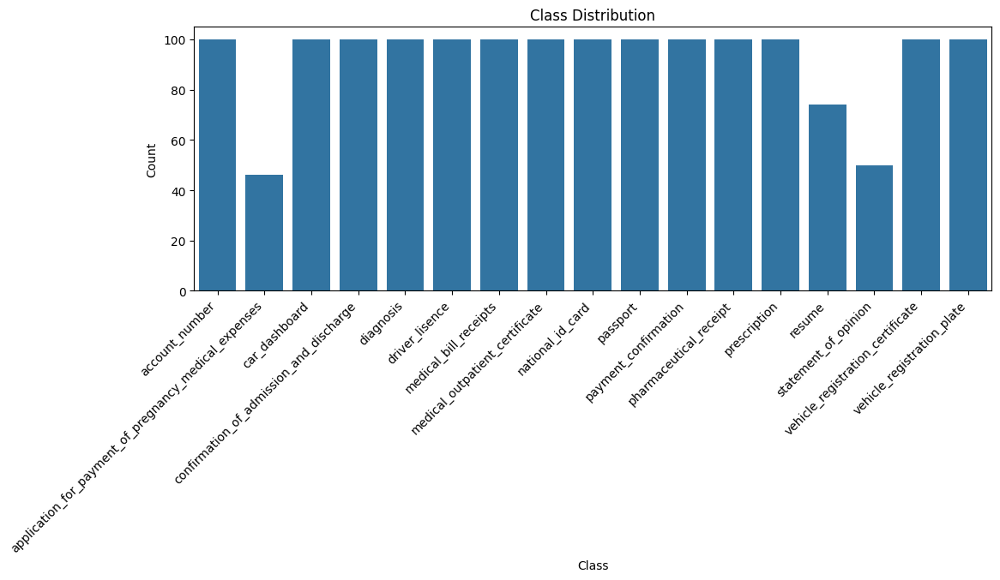

In [15]:
# 클래스 분포 계산
class_distribution = {class_name: len([label for _, label in trn_dataset if label == class_label]) for class_label, class_name in label_to_class_name.items()}

# 클래스 분포를 데이터프레임으로 변환
df = pd.DataFrame(list(class_distribution.items()), columns=['Class', 'Count'])

# 클래스 분포를 시각화
plt.figure(figsize=(12, 4))
sns.barplot(x='Class', y='Count', data=df)
plt.title('Class Distribution')
plt.xlabel('Class')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Count')

# WandB에 그래프 로깅
wandb.log({"class_distribution": wandb.Image(plt)})

# 그래프 표시
plt.show()

### 4.3 평가 데이터 이미지 시각화

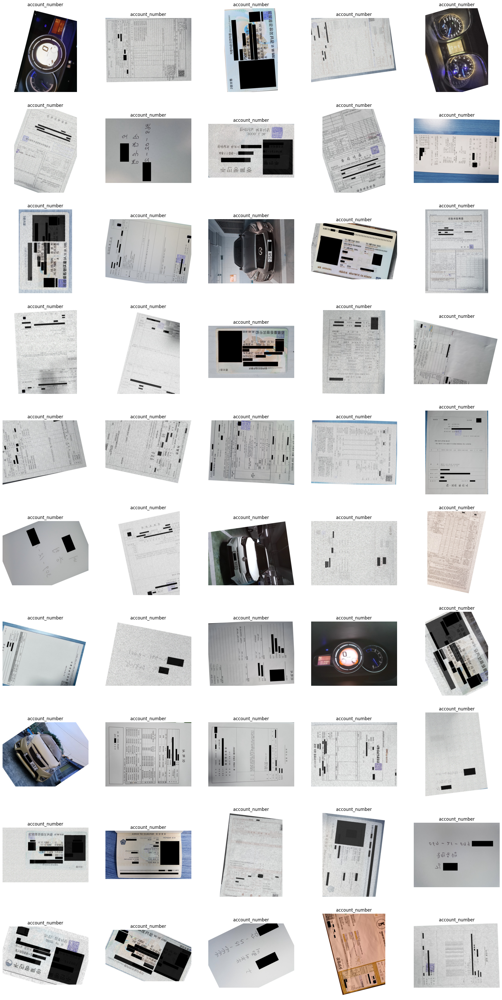

In [16]:
# 시각화할 이미지 개수
img_count = 50

# # 데이터셋의 총 길이를 가져옴
# dataset_len = len(tst_dataset)

# # 무작위로 선택된 인덱스 리스트를 생성
# selected_indices = random.sample(range(dataset_len), img_count)
# print("index: ", selected_indices)

# WandB에 이미지 로깅
wandb.log({"test_images": [wandb.Image(image, caption=label_to_class_name[label]) for i in range(img_count) for image, label in [tst_dataset[i]]]})

# 로컬에서 이미지 플로팅
fig, axes = plt.subplots(img_count // 5, 5, figsize=(25, 5 * (img_count // 5)))
# for i, idx in enumerate(selected_indices):
for i in range(img_count):
    image, label = tst_dataset[i]
    row_idx = i // 5  
    col_idx = i % 5 
    axes[row_idx, col_idx].imshow(image.permute(1, 2, 0))
    axes[row_idx, col_idx].set_title(label_to_class_name[label])
    axes[row_idx, col_idx].axis('off')

plt.show()

- 평가 데이터에 적용된 Augmentation 파악
1. Rotation
2. Flip
3. Rotation + Flip
4. Crop
5. Adding Noise

In [17]:
wandb.finish()